# DSCI 552 Assigment 5 Part 2

For [rod pumps](https://www.youtube.com/watch?v=nhxbfMG1y1s), a dynamometer card plots the stroke position (i.e., vertical displacement) of the pump versus the load on the pump.

The shape of dynamometer cards can be used to diagnosis problems, see:
* [Dyno Survey](https://www.downholediagnostic.com/dynamometer)
* [Dynamometer card common shapes and description](https://www.researchgate.net/figure/Dynamometer-card-common-shapes-and-description-Wang-et-al-2021_tbl1_354171410)

Use similar techniques from part 1 to analyze the card shape (both position columns and load columns).

Before applying dimensional reduction and clustering techniques, make sure to create a clean dataset. For example,

*   Rotate the position values (and corresponding load values) so that the position curves look like cosine waves. The numpy functions np.argmax and np.roll should come in handy here.
*   Exclude non-physical cards, like cards with negative loads.
*   Normalize each card so that both the position and load values range from 0 to 1. Scikit Learn’s MinMaxScaler should be useful.






Of particular interest is the freezing card shape, see below. For this card shape, the load
increases as the position increases. For part 2 find all freezing card shapes and return the
corresponding row numbers. Also, plot each of the freezing card shapes

In [1]:
# All required imports are in this cell, User should add required imports if needed
import io
import requests
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

In [2]:
# Defining the path as per the data location
data_link = "https://drive.google.com/uc?id=1JCdZusC6vtD2KzCvm3CGznVIBzK0_mKh"

# Fetch the content of the CSV file
response = requests.get(data_link).content
data_raw = pd.read_csv(io.StringIO(response.decode('utf-8')))

In [3]:
# Filtering the data such that we have the cards that have 200 NumPoints
d200 = data_raw[data_raw['NumPoints']==200]
d200

,WellName,CardDate,CardType,CardLocation,NumPoints,Position0,Position1,Position2,Position3,Position4,...,Load190,Load191,Load192,Load193,Load194,Load195,Load196,Load197,Load198,Load199
0,QFB 0,2014-01-01 03:41:30,POF,SU,200,85.50,85.50,86.00,86.25,86.50,...,4397.0,4343.0,4281.0,4207.0,4152.0,4121.0,4118.0,4077.0,4033.0,3933.0
1,QFB 1,2014-01-01 02:58:06,CUR,SU,200,48.00,48.00,48.00,47.75,47.75,...,3546.0,3602.0,3654.0,3687.0,3703.0,3690.0,3684.0,3683.0,3672.0,3588.0
2,QFB 2,2014-01-01 03:46:30,POF,SU,200,84.00,84.00,83.75,83.75,83.75,...,3039.0,3034.0,3031.0,3011.0,3000.0,2996.0,2997.0,3000.0,3002.0,2979.0
3,QFB 5,2014-01-01 02:38:54,CUR,SU,200,40.25,40.25,40.25,40.25,40.00,...,3023.0,3003.0,2983.0,2956.0,2926.0,2902.0,2884.0,2862.0,2827.0,2685.0
4,QFB 6,2014-01-01 02:50:36,CUR,SU,200,100.00,100.00,99.75,99.75,99.50,...,3678.0,3624.0,3636.0,3571.0,3590.0,3557.0,3528.0,3527.0,3519.0,3322.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8176,GTV 19H,2014-01-01 06:39:30,CUR,SU,200,0.50,0.50,0.75,1.00,1.25,...,-127.0,-127.0,-127.0,-127.0,-127.0,-127.0,-127.0,-127.0,-127.0,-127.0
8177,GTV 20,2014-01-01 04:09:18,CUR,SU,200,48.00,48.00,48.00,47.75,47.75,...,2686.0,2684.0,2676.0,2664.0,2652.0,2641.0,2631.0,2623.0,2626.0,2626.0
8178,GTV 21,2014-01-01 03:26:30,CUR,SU,200,35.25,35.25,35.25,35.50,35.50,...,2501.0,2488.0,2477.0,2474.0,2470.0,2469.0,2466.0,2460.0,2455.0,2433.0
8179,GTV 22,2014-01-01 03:05:12,CUR,SU,200,36.00,36.00,36.00,35.75,35.75,...,2198.0,2202.0,2186.0,2177.0,2174.0,2151.0,2130.0,2121.0,2104.0,2110.0


**CLEANING**

Initially, we depicted the position profiles of all cards of d200 in our first plot.

The plot consists of 3 sub-plots for position profiles and 3 sub-plots for load profiles






1.   first-sub-plot of position profiles depict the position values varying across 200 different positions.

2. second-sub-plot of positions profiles depicts the outliers (in this assignment it is not required anywhere). We depicted the abnormal cards as per the position values. This is in continuation to Assignment Part 1. Note: we didn't remove the outliers in this case of position profile anamolies.

3.  third-sub-plot of positions profiles depicts the position profiles of cleaned dataset by removing abnormal position values. In this scenario it will be similar to the first-sub-plot as we didn't remove anything for the analysis further.



At this stage we will have the data that is cleaned from position anamolies (in general case) --> d200_cleaned_position


In the next main plot, we depicted the load profiles of all cards of d200_cleaned_position in our first plot.

1.   first-sub-plot of load profiles depict the load values varying across 200 different positions (indexes).
2.   second-sub-plot of load profiles depicts the non-physical cards. We depicted the non-physical as per the load values if they are < 0 at any index. Now, we have removed the non-physical cards from our dataset.
3.   third-sub-plot of load profiles depicts the load profiles of cleaned dataset by removing abnormal load values. In this scenario it will be the removal of non-physical cards which have load < 0 in one their indexes.

At this stage we will have the data that is cleaned from position and load anamolies (in general case) --> d200_cleaned_position_load

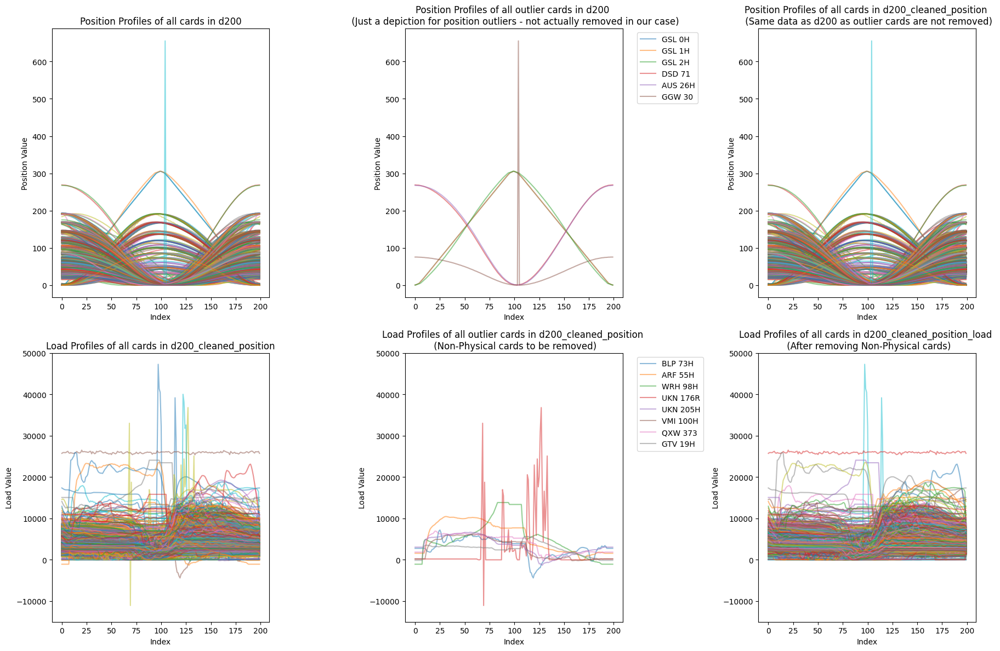

In [4]:
# As the position columns are 5 to 205
position_columns = d200.columns[5:205]

# Generate ticks for every 25 positions
x_ticks = np.arange(0, len(position_columns)+1, 25)

# Create a figure and axis object for the first plot (Position Profiles)
fig, axs = plt.subplots(2, 3, figsize=(18, 12))

# Plot all position profiles for the cards in d200
for index, row in d200.iterrows():
    axs[0, 0].plot(range(len(position_columns)), row[position_columns], alpha=0.5)

axs[0, 0].set_title('Position Profiles of all cards in d200')
axs[0, 0].set_xlabel('Index')
axs[0, 0].set_ylabel('Position Value')

# Set ticks and labels for every 25 positions
axs[0, 0].set_xticks(x_ticks)
axs[0, 0].set_xticklabels(x_ticks)

# Get the limits of the x-axis and y-axis for the first plot
x_min, x_max = axs[0, 0].get_xlim()
y_min, y_max = axs[0, 0].get_ylim()

# Collect card names with outliers and their corresponding data for position profiles
outlier_cards_data_position = []

# Separate plots for outlier cards based on position if you want to filter the dataset from cards with abnormal position (used when we need operations based on column wise comparisions but now we are doing row-wise so doesn't make any difference)
for index, row in d200.iterrows():
    if (row[position_columns] > 200).any():
        outlier_cards_data_position.append((row['WellName'], row[position_columns]))  # Collect card name and its data with outliers

# Plot all outlier cards on the same plot (Position Profiles)
for card_name, card_data in outlier_cards_data_position:
    axs[0, 1].plot(range(len(position_columns)), card_data, alpha=0.5, label=card_name)

axs[0, 1].set_title('Position Profiles of all outlier cards in d200 \n (Just a depiction for position outliers - not actually removed in our case)')
axs[0, 1].set_xlabel('Index')
axs[0, 1].set_ylabel('Position Value')
# Set ticks and labels for every 25 position values
axs[0, 1].set_xticks(x_ticks)
axs[0, 1].set_xticklabels(x_ticks)

# Place legend outside the plot for Position Profiles
axs[0, 1].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Remove outliers from d200 to create d200_cleaned_position
outlier_cards_names_position = [card[0] for card in outlier_cards_data_position]
#d200_cleaned_position = d200[~d200['WellName'].isin(outlier_cards_names_position)] - this is required if you want to perform column-wise operations (not required in this case)
d200_cleaned_position = d200

# Plot position profiles for d200_cleaned_position
for index, row in d200_cleaned_position.iterrows():
    axs[0, 2].plot(range(len(position_columns)), row[position_columns], alpha=0.5)  # Plot each position profile with some transparency

axs[0, 2].set_title('Position Profiles of all cards in d200_cleaned_position \n (Same data as d200 as outlier cards are not removed)')
axs[0, 2].set_xlabel('Index')
axs[0, 2].set_ylabel('Position Value')

# Set ticks and labels for every 25 position values
axs[0, 2].set_xticks(x_ticks)
axs[0, 2].set_xticklabels(x_ticks)

# Set the limits of the x-axis and y-axis for the third plot to match the first plot
axs[0, 2].set_xlim(x_min, x_max)
axs[0, 2].set_ylim(y_min, y_max)

# As the load columns are 205 to 405
load_columns = d200_cleaned_position.columns[205:405]

# Generate ticks for every 25 loads
x_ticks = np.arange(0, len(load_columns)+1, 25)

# Plot all load profiles for the cards in d200_cleaned_position
for index, row in d200_cleaned_position.iterrows():
    axs[1, 0].plot(range(len(load_columns)), row[load_columns], alpha=0.5)

axs[1, 0].set_title('Load Profiles of all cards in d200_cleaned_position')
axs[1, 0].set_xlabel('Index')
axs[1, 0].set_ylabel('Load Value')

# Set ticks and labels for every 25 load values
axs[1, 0].set_xticks(x_ticks)
axs[1, 0].set_xticklabels(x_ticks)
axs[1, 0].set_ylim(-15000, 50000)

# Collect card names with outliers and their corresponding data
outlier_cards_data = []

# Separate plots for outlier cards
for index, row in d200_cleaned_position.iterrows():
    # If we want further cleaning we can exclude cards that have loads > 20000 based on user preference
    if (row[load_columns] < 0).any():
        outlier_cards_data.append((row['WellName'], row[load_columns]))  # Collect card name and its data with outliers

# Plot all outlier cards on the same plot
for card_name, card_data in outlier_cards_data:
    axs[1, 1].plot(range(len(load_columns)), card_data, alpha=0.5, label=card_name)

axs[1, 1].set_title('Load Profiles of all outlier cards in d200_cleaned_position \n (Non-Physical cards to be removed)')
axs[1, 1].set_xlabel('Index')
axs[1, 1].set_ylabel('Load Value')
axs[1, 1].set_ylim(-15000, 50000)

# Set ticks and labels for every 25 load values
axs[1, 1].set_xticks(x_ticks)
axs[1, 1].set_xticklabels(x_ticks)

# Place legend outside the plot
axs[1, 1].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Remove outliers from d200_cleaned_position to create d200_cleaned_position_load
outlier_cards_names = [card[0] for card in outlier_cards_data]
d200_cleaned_position_load = d200_cleaned_position[~d200_cleaned_position['WellName'].isin(outlier_cards_names)]

# Plot load profiles for d200_cleaned_position_load
for index, row in d200_cleaned_position_load.iterrows():
    axs[1, 2].plot(range(len(load_columns)), row[load_columns], alpha=0.5)  # Plot each load profile with some transparency

axs[1, 2].set_title('Load Profiles of all cards in d200_cleaned_position_load \n (After removing Non-Physical cards)')
axs[1, 2].set_xlabel('Index')
axs[1, 2].set_ylabel('Load Value')
axs[1, 2].set_ylim(-15000, 50000)

# Set ticks and labels for every 25 load values
axs[1, 2].set_xticks(x_ticks)
axs[1, 2].set_xticklabels(x_ticks)

# Set the limits of the x-axis and y-axis for the third plot to match the first plot
axs[1, 2].set_xlim(axs[1, 1].get_xlim())
axs[1, 2].set_ylim(axs[1, 1].get_ylim())

plt.tight_layout()
plt.show()

**ROTATION**

Now we are rotating position values and corresponding load values of each card such that maximum position value of each card is aligned to the starting index. This will generate a visually appealing cosine curves.

As we are rotating the respective load values according to the position values we are preserving the internal relation between the positions and loads.

At this stage we will have the data that is roated based on maximum position value of each card (for that respective card) --> d200_cleaned_position_load_rotated

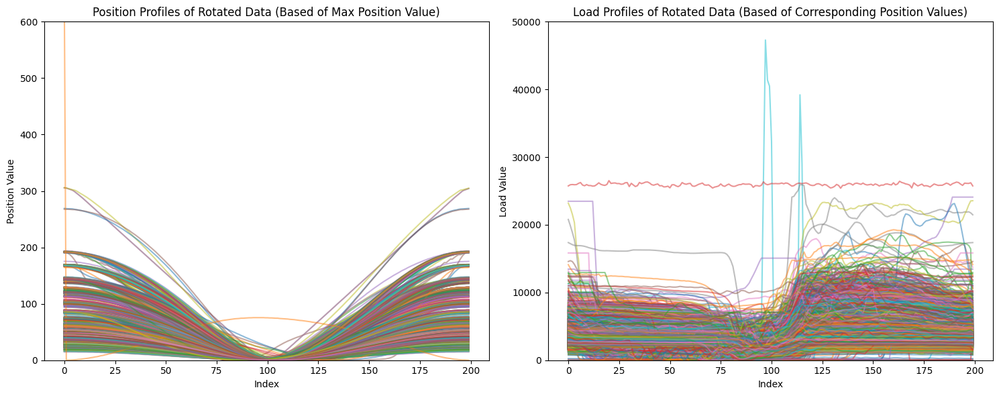

In [5]:
# Initialize an empty list to store the rotated data
d200_cleaned_position_load_rotated = []

# Iterate through each well in d200_cleaned_position_load
for index, row in d200_cleaned_position_load.iterrows():
    # Extract WellName and position/load values
    well_name = row['WellName']
    positions = row[position_columns].values
    loads = row[load_columns].values

    # Find the index of the maximum value in the position profile
    max_index = np.argmax(positions)

    # Rotate position and load values based on the maximum index
    rotated_positions = np.roll(positions, -max_index)
    rotated_loads = np.roll(loads, -max_index)

    # Append the rotated data along with the WellName to the final list
    d200_cleaned_position_load_rotated.append([well_name, rotated_positions, rotated_loads])

# Create a DataFrame with the rotated data and WellName column
columns = ['WellName', 'Rotated_Positions', 'Rotated_Loads']
d200_cleaned_position_load_rotated_df = pd.DataFrame(d200_cleaned_position_load_rotated, columns=columns)

# Create a figure with two subplots side by side
fig, axs = plt.subplots(1, 2, figsize=(15, 6))

# Plot position profiles in the first subplot
for _, row in d200_cleaned_position_load_rotated_df.iterrows():
    axs[0].plot(row['Rotated_Positions'], alpha=0.5)

axs[0].set_title('Position Profiles of Rotated Data (Based of Max Position Value)')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Position Value')
axs[0].set_ylim(0, 600)
# Plot load profiles in the second subplot
for _, row in d200_cleaned_position_load_rotated_df.iterrows():
    axs[1].plot(row['Rotated_Loads'], alpha=0.5)

axs[1].set_title('Load Profiles of Rotated Data (Based of Corresponding Position Values)')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Load Value')
axs[1].set_ylim(0, 50000)
plt.tight_layout()
plt.show()

**NORMALIZATION**

We have normalized the rotated data such that it will be easy to compare different cards whose position and load scales might be varying. Normalization provides a comparative measure between the cards of different scales by making all the position and load values of each card into a common scale of 0 to 1.

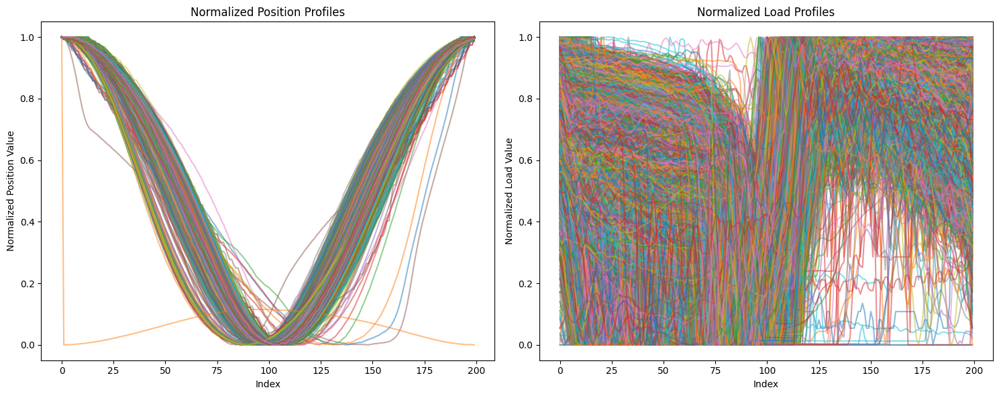

In [6]:
# Initialize MinMaxScaler
scaler = MinMaxScaler()

# Normalize the position and load profiles and store in a new DataFrame
d200_cleaned_rotated_normalized = d200_cleaned_position_load_rotated_df.copy()
d200_cleaned_rotated_normalized['Normalized_Positions'] = d200_cleaned_rotated_normalized['Rotated_Positions'].apply(lambda x: scaler.fit_transform(x.reshape(-1, 1)).flatten())
d200_cleaned_rotated_normalized['Normalized_Loads'] = d200_cleaned_rotated_normalized['Rotated_Loads'].apply(lambda x: scaler.fit_transform(x.reshape(-1, 1)).flatten())

# Remove the rotated positions and loads columns
d200_cleaned_rotated_normalized.drop(['Rotated_Positions', 'Rotated_Loads'], axis=1, inplace=True)

# Create a figure with two subplots side by side
fig, axs = plt.subplots(1, 2, figsize=(15, 6))

# Plot position profiles in the first subplot
plt.subplot(1, 2, 1)
for positions in d200_cleaned_rotated_normalized['Normalized_Positions']:
    plt.plot(range(len(positions)), positions, alpha=0.5)

plt.title('Normalized Position Profiles')
plt.xlabel('Index')
plt.ylabel('Normalized Position Value')
plt.tight_layout()

# Plot load profiles in the second subplot
plt.subplot(1, 2, 2)
for loads in d200_cleaned_rotated_normalized['Normalized_Loads']:
    plt.plot(range(len(loads)), loads, alpha=0.5)

plt.title('Normalized Load Profiles')
plt.xlabel('Index')
plt.ylabel('Normalized Load Value')
plt.tight_layout()

plt.show()

**DIMENSIONALITY REDUCTION AND CLUSTERING**
1.   In order to observe the underlying patterns between different card shapes, we can reduce the number of dimensions of the data using dimensionality reduction techniques like PCA.

2.  PCA helps us to project the data onto less components which enables us to draw a comparative measure between the cards, we can adjust the number of components as per the requirement - (in our case we have taken it as 10).

3.  After projecting the components that have the highest variance i.e., PC1 and PC2, we can use clustering techniques to group the similar cards together.

4.   We have use K-Means clustering to divide the cards into clusters after projection. We can adjust the value of k as per the requirement.

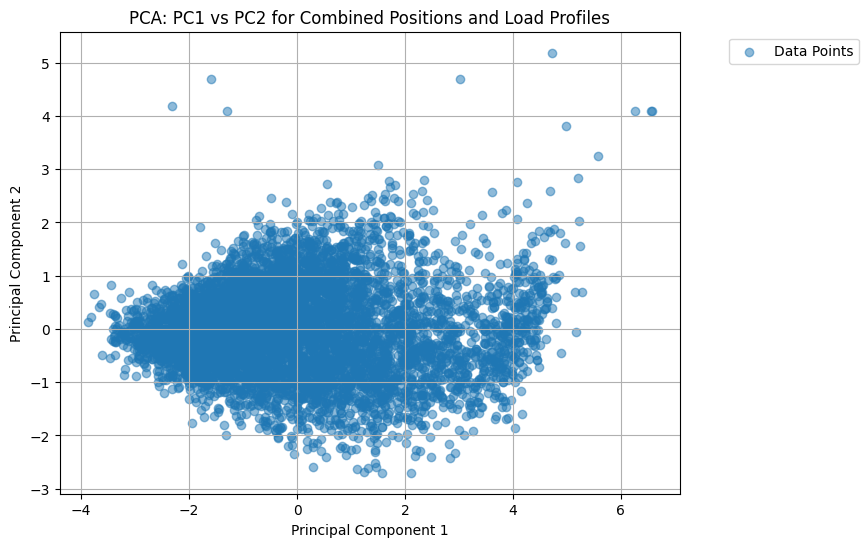

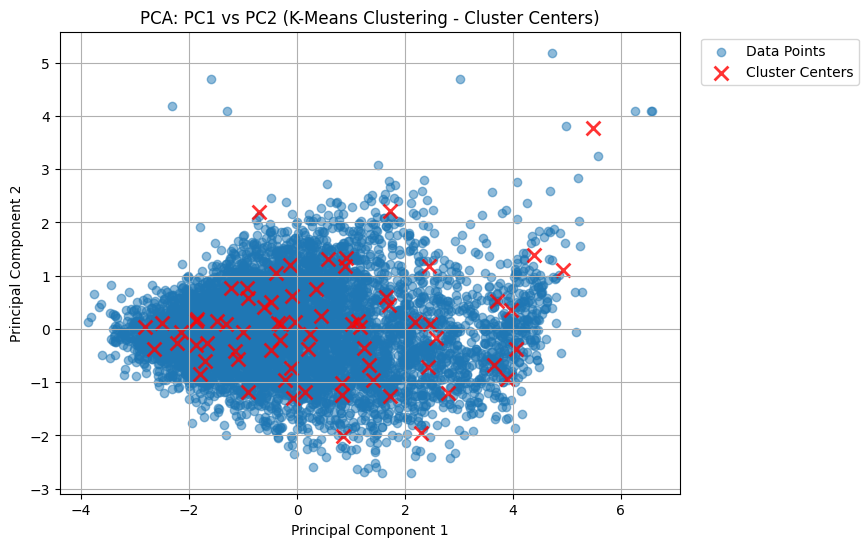

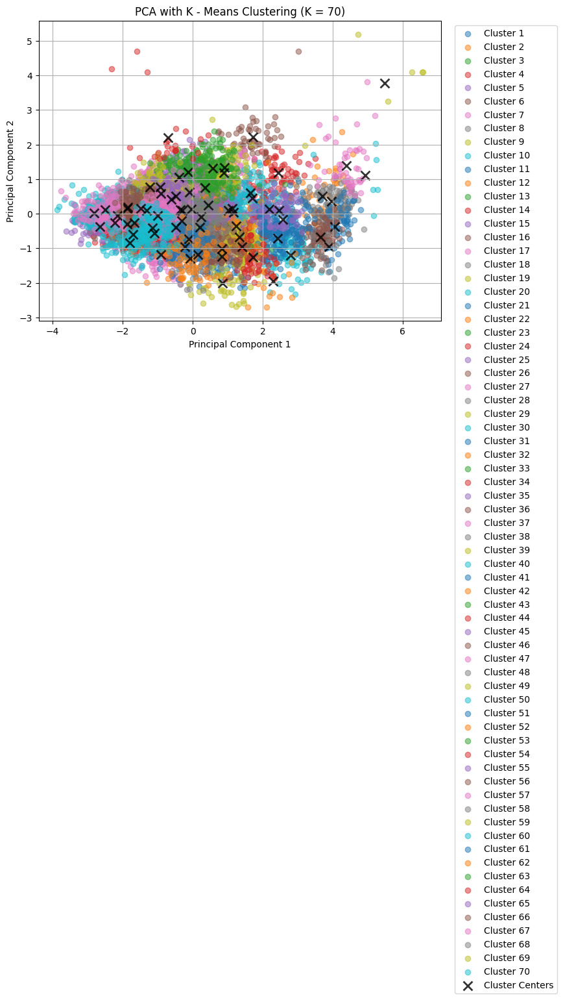

In [7]:
# Stack normalized position profiles vertically
normalized_positions_stacked = np.vstack(d200_cleaned_rotated_normalized['Normalized_Positions'].values)
# Stack normalized load profiles vertically
normalized_loads_stacked = np.vstack(d200_cleaned_rotated_normalized['Normalized_Loads'].values)

# Stack them horizontally to get combined profiles
combined_profiles = np.hstack((normalized_positions_stacked, normalized_loads_stacked))

# Perform PCA for dimensionality reduction
pca = PCA(n_components=10)
reduced_data = pca.fit_transform(combined_profiles)

# Plot PCA1 vs PCA2
plt.figure(figsize=(8, 6))
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], alpha=0.5)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA: PC1 vs PC2 for Combined Positions and Load Profiles')
plt.legend(['Data Points'], loc='upper right', bbox_to_anchor=(1.3, 1))
plt.grid(True)

# Set the random_state value
random_state_value = 42  # You can use any integer value here

# Apply K-means clustering
kmeans = KMeans(n_clusters=70, n_init=10, random_state=random_state_value)  # Adjust the number of clusters as needed
clusters = kmeans.fit_predict(reduced_data)

# Get cluster centers
cluster_centers = kmeans.cluster_centers_

# Plot cluster centers on the first plot
plt.figure(figsize=(8, 6))
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], alpha=0.5)
for cluster_id in range(70):  # Assuming 70 clusters
    plt.scatter(cluster_centers[cluster_id, 0], cluster_centers[cluster_id, 1], marker='x', color='red', alpha=0.8, s=100, linewidths=2)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA: PC1 vs PC2 (K-Means Clustering - Cluster Centers)')
plt.grid(True)
plt.legend(['Data Points', 'Cluster Centers'], loc='upper right', bbox_to_anchor=(1.30, 1))
plt.show()

# Plot clusters with different colors
plt.figure(figsize=(8, 6))
for cluster_id in range(70):  # Assuming 70 clusters
    cluster_data = reduced_data[clusters == cluster_id]
    plt.scatter(cluster_data[:, 0], cluster_data[:, 1], alpha=0.5, label=f'Cluster {cluster_id+1}')
plt.scatter(cluster_centers[:, 0], cluster_centers[:, 1], marker='x', color='black', alpha=0.8, s=100, linewidths=2, label='Cluster Centers')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA with K - Means Clustering (K = 70)')
plt.legend(loc='upper right', bbox_to_anchor=(1.30, 1))
plt.grid(True)
plt.legend(loc='upper right', bbox_to_anchor=(1.30, 1))
plt.show()

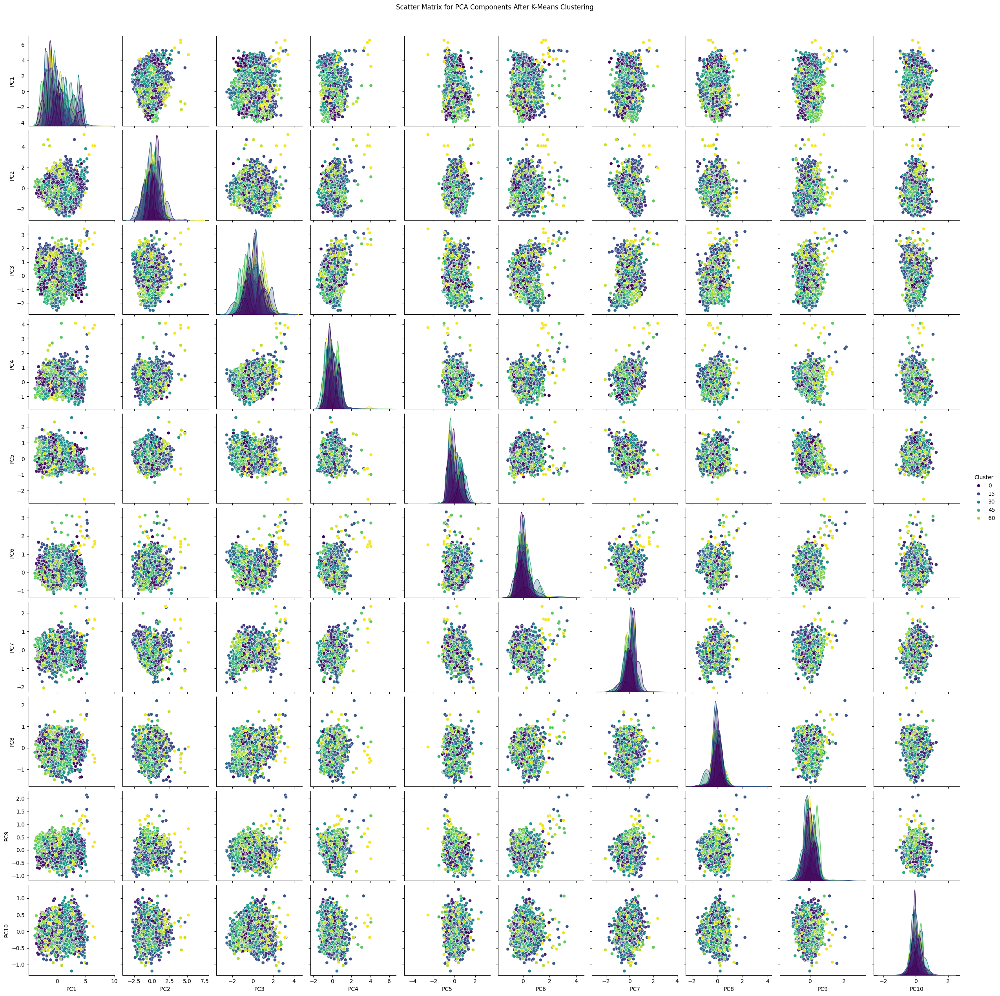

In [8]:
# Convert reduced_data (PCA components) to DataFrame
pca_df = pd.DataFrame(reduced_data, columns=[f'PC{i+1}' for i in range(reduced_data.shape[1])])

# Add cluster labels to the DataFrame
pca_df['Cluster'] = clusters

# Plot the scatter matrix
sns.pairplot(pca_df, hue='Cluster', palette='viridis')
plt.suptitle('Scatter Matrix for PCA Components After K-Means Clustering', y=1.02)  # Adjust title position
plt.show()

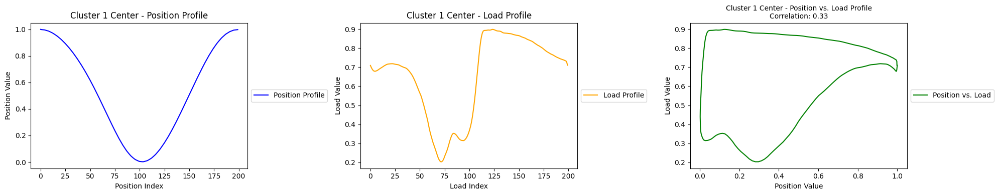

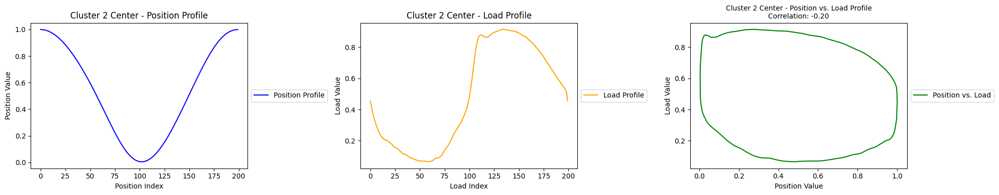

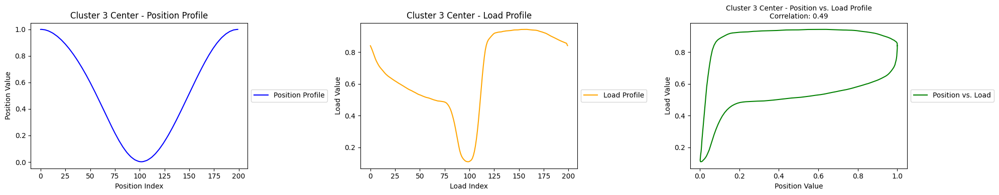

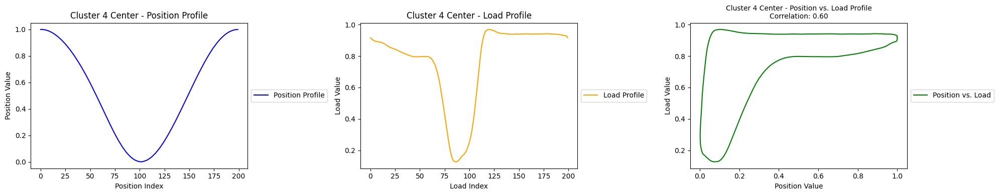

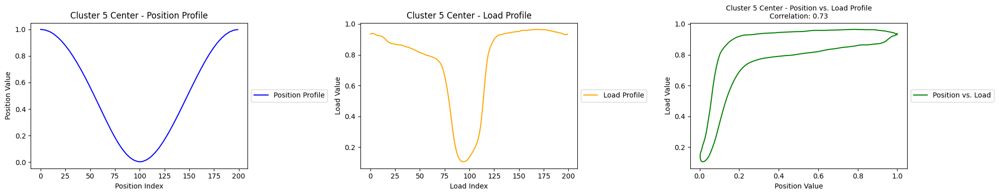

...

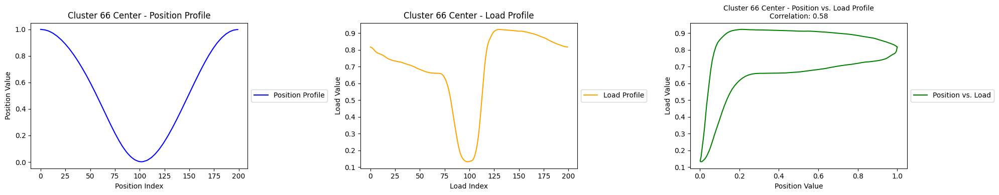

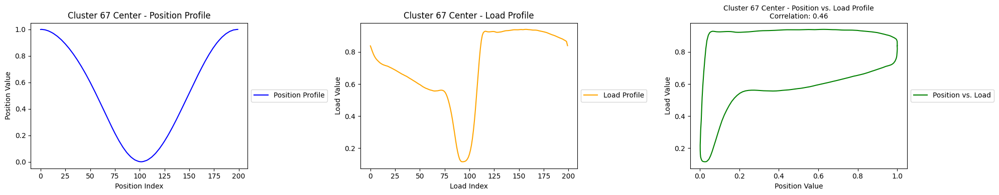

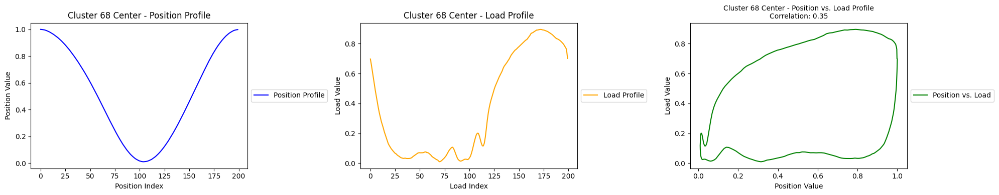

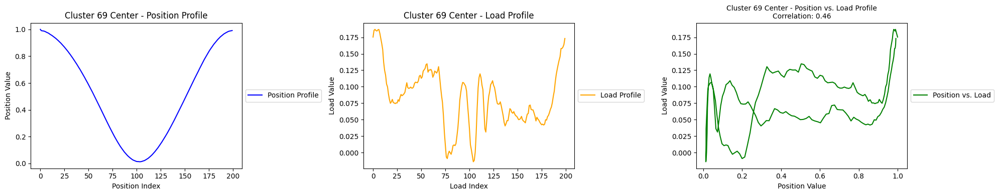

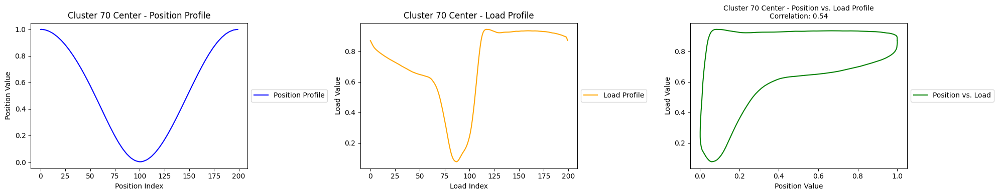

In [9]:
# Define a function to plot position profiles, load profiles, and position vs. load profiles for cluster centers
def plot_cluster_centers(cluster_centers, pca):
    num_clusters = cluster_centers.shape[0]

    # Inverse transform cluster centers to get them back to the original feature space
    cluster_centers_original = pca.inverse_transform(cluster_centers)

    # Set the width for the figures and subplots
    figure_width = 20
    subplot_width = 6

    # Plot position profiles, load profiles, and position vs. load profiles for each cluster center
    for i in range(num_clusters):
        plt.figure(figsize=(figure_width, 4))

        # Plot position profile
        plt.subplot(1, 3, 1)
        plt.plot(cluster_centers_original[i, :200], label='Position Profile', color='blue')
        plt.xlabel('Position Index')
        plt.ylabel('Position Value')
        plt.title(f'Cluster {i+1} Center - Position Profile')
        plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))  # Place legend outside the plot
        plt.subplots_adjust(wspace=0.5)  # Adjust width between subplots

        # Plot load profile
        plt.subplot(1, 3, 2)
        plt.plot(cluster_centers_original[i, 200:], label='Load Profile', color='orange')
        plt.xlabel('Load Index')
        plt.ylabel('Load Value')
        plt.title(f'Cluster {i+1} Center - Load Profile')
        plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))  # Place legend outside the plot
        plt.subplots_adjust(wspace=0.5)  # Adjust width between subplots

        # Plot position vs. load profile
        plt.subplot(1, 3, 3)
        plt.plot(cluster_centers_original[i, :200], cluster_centers_original[i, 200:], label='Position vs. Load', color='green')
        plt.xlabel('Position Value')
        plt.ylabel('Load Value')
        plt.title(f'Cluster {i+1} Center - Position vs. Load Profile')
        plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))  # Place legend outside the plot
        plt.subplots_adjust(wspace=0.5)  # Adjust width between subplots

        # Calculate and plot correlation for position vs. load profile
        position_load_correlation = np.corrcoef(cluster_centers_original[i, :200], cluster_centers_original[i, 200:], rowvar=False)[0, 1]
        plt.title(f'Cluster {i+1} Center - Position vs. Load Profile\nCorrelation: {position_load_correlation:.2f}', fontsize=10)

        plt.tight_layout()
        plt.show()
    return cluster_centers_original;

# Call the function to plot profiles for cluster centers
cluster_centers_original = plot_cluster_centers(cluster_centers, pca)

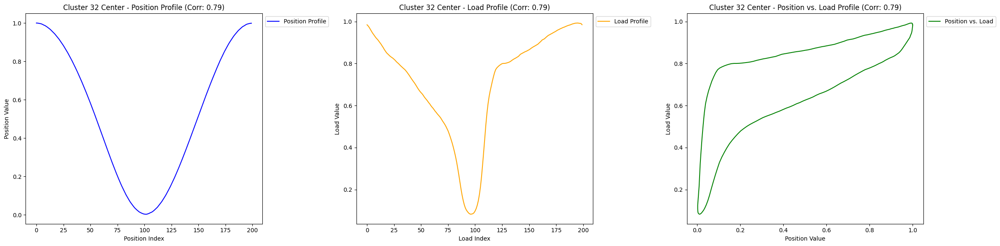

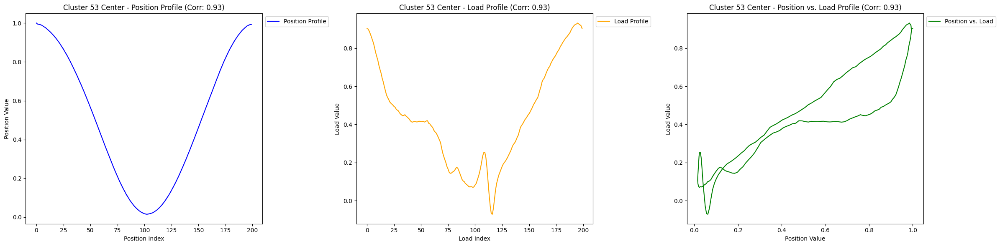

In [10]:
# Define a function to plot position profiles, load profiles, and position vs. load profiles for cluster centers
def plot_correlated_clusters(cluster_centers, pca, threshold=0.5):
    num_clusters = cluster_centers.shape[0]

    # Inverse transform cluster centers to get them back to the original feature space
    cluster_centers_original = pca.inverse_transform(cluster_centers)

    # Calculate correlations between position and load values for each cluster center
    correlations = np.zeros(num_clusters)
    for i in range(num_clusters):
        correlations[i] = np.corrcoef(cluster_centers_original[i, :200], cluster_centers_original[i, 200:])[0, 1]

    # Find clusters with correlation higher than the threshold
    correlated_clusters = np.where(correlations > threshold)[0]

    # # Plot profiles for correlated clusters
    for cluster_id in correlated_clusters:
        plt.figure(figsize=(24, 6))  # Adjust figure size for wider subplots

        # Plot position profile
        plt.subplot(1, 3, 1)
        plt.plot(cluster_centers_original[cluster_id, :200], label='Position Profile', color='blue')
        plt.xlabel('Position Index')
        plt.ylabel('Position Value')
        plt.title(f'Cluster {cluster_id+1} Center - Position Profile (Corr: {correlations[cluster_id]:.2f})')
        plt.legend(loc='upper left', bbox_to_anchor=(1, 1))

        # Plot load profile
        plt.subplot(1, 3, 2)
        plt.plot(cluster_centers_original[cluster_id, 200:], label='Load Profile', color='orange')
        plt.xlabel('Load Index')
        plt.ylabel('Load Value')
        plt.title(f'Cluster {cluster_id+1} Center - Load Profile (Corr: {correlations[cluster_id]:.2f})')
        plt.legend(loc='upper left', bbox_to_anchor=(1, 1))

        # Plot position vs. load profile
        plt.subplot(1, 3, 3)
        plt.plot(cluster_centers_original[cluster_id, :200], cluster_centers_original[cluster_id, 200:], label='Position vs. Load', color='green')
        plt.xlabel('Position Value')
        plt.ylabel('Load Value')
        plt.title(f'Cluster {cluster_id+1} Center - Position vs. Load Profile (Corr: {correlations[cluster_id]:.2f})')
        plt.legend(loc='upper left', bbox_to_anchor=(1, 1))

        plt.tight_layout()
        plt.show()
    return correlated_clusters
# Call the function to plot profiles for correlated clusters - Adjust the threshold as required as per your filteration criteria
correlated_clusters = plot_correlated_clusters(cluster_centers, pca, threshold=0.75)

**VISUALIZATION**

Plotting inset plots of positions vs load profiles of the cluster centers to inspect the card shape data from bird's eye view

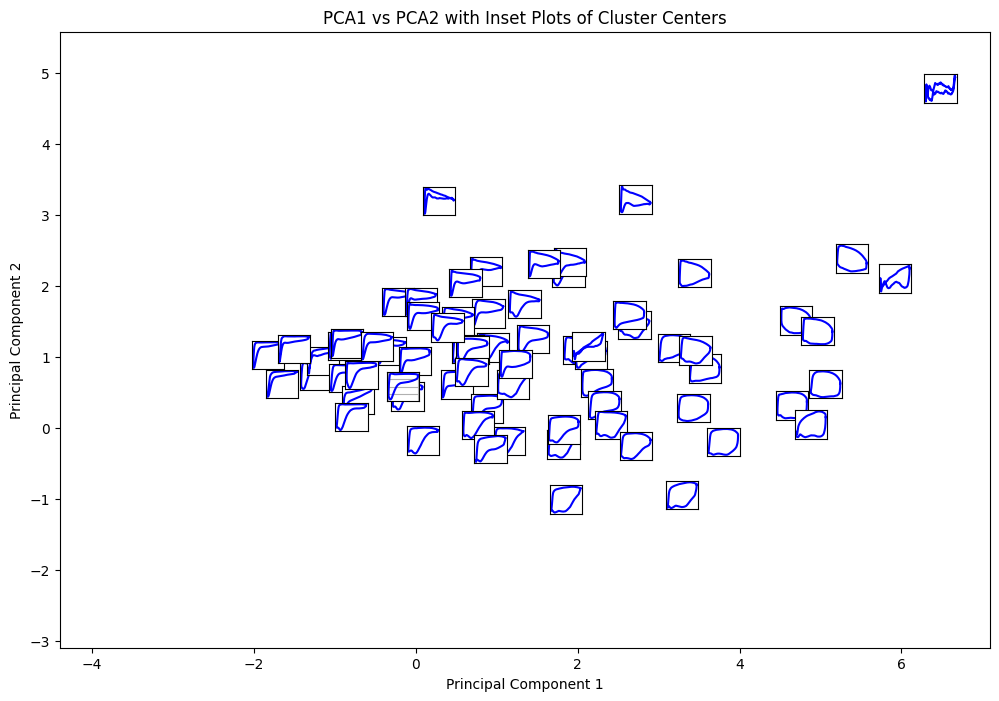

In [11]:
# Define a function to plot position profiles, load profiles, and position vs. load profiles for all clusters
def plot_all_clusters(cluster_centers, pca):
    num_clusters = cluster_centers.shape[0]

    # Inverse transform cluster centers to get them back to the original feature space
    cluster_centers_original = pca.inverse_transform(cluster_centers)

    # Create a figure and axis for PCA1 vs PCA2 plot
    fig, ax = plt.subplots(figsize=(12, 8))

    # Plot PCA1 vs PCA2 for all points
    scatter = ax.scatter(reduced_data[:, 0], reduced_data[:, 1], color='white', alpha=0.5, label='All Points')

    # Adding labels and title
    ax.set_xlabel('Principal Component 1')
    ax.set_ylabel('Principal Component 2')
    ax.set_title('PCA1 vs PCA2 with Inset Plots of Cluster Centers')

    # Adding inset axes plots for position vs load profiles for each cluster
    for i, center in enumerate(cluster_centers):
        # Creating inset axes with custom location - cluster centers and larger size
        ax_inset = inset_axes(ax, width="20%", height="20%", loc='center', bbox_to_anchor=(center[0], center[1], 2, 2), bbox_transform=ax.transData)

        # Plotting position vs load profile in inset
        positions = cluster_centers_original[i, :200]
        loads = cluster_centers_original[i, 200:]
        ax_inset.plot(positions, loads, color='blue')
        # Removing x-labels and y-labels
        ax_inset.set_xticklabels([])
        ax_inset.set_yticklabels([])
        ax_inset.tick_params(axis='both', which='both', length=0)


    # Displaying the plot
    plt.grid(True)
    plt.show()

# Call the function to plot inset plots for all clusters
plot_all_clusters(cluster_centers, pca)

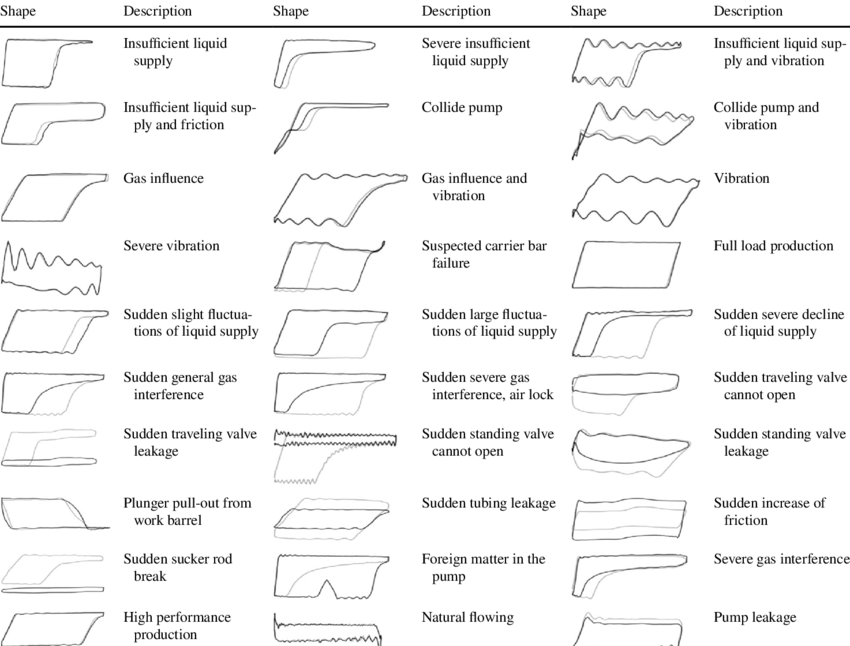

**Required Freezing Card Shapes**

In [12]:
# Iterate over the indices of the correlated clusters
for cluster_id in correlated_clusters:
    # Filter the original dataset based on the cluster labels of the correlated cluster
    correlated_cards_data = d200_cleaned_position_load[clusters == cluster_id]

    # Extract the number of correlated cards
    num_correlated_cards = correlated_cards_data.shape[0]

    # Print the count of correlated cards
    print(f"Number of cards in Cluster {cluster_id+1}: {num_correlated_cards}")

    # Iterate over the rows in the correlated cluster
    for row_number, (index, row) in enumerate(correlated_cards_data.iterrows(), start=1):
        # Extract the card name
        card_name = row['WellName']

        # Print the card name along with its row number
        print(f"Row {index}: {card_name}")

Number of cards in Cluster 32: 56
Row 252: BHN 3D
Row 254: BHN 3G
Row 267: BHN 7
Row 290: BHN 24
Row 425: BHN 180
Row 503: BHN 271
Row 521: BHN 294
Row 715: JFB 8
Row 917: ZHM 20
Row 1303: GTK 4
Row 1366: GUQ 33
Row 1369: GUQ 39
Row 1381: GUQ 53
Row 1391: GUQ 62
Row 1397: GUQ 70
Row 1556: TXW 70
Row 1705: WRH 29
Row 1975: TCH 61
Row 1978: TCH 64
Row 2071: UJY 25
Row 2415: BEN 41
Row 2956: DSD 53
Row 3349: GHZ 9
Row 3494: OGJ 8
Row 4818: ZNI 0-9
Row 4835: ZNI 2-4
Row 4851: ZNI 4-3
Row 5433: BRD 20
Row 5443: UDQ 1
Row 5814: DYJ 8
Row 5891: DYJ 91
Row 5945: MWM 11R
Row 5952: MWM 21
Row 6016: VYJ 55
Row 6049: KSF 34
Row 6115: BZO 6-1
Row 6138: BZO 10-0
Row 6218: BZO 23-1
Row 6219: BZO 23-2
Row 6243: BZO 26-0
Row 6273: BZO 59
Row 6275: BZO 64
Row 6285: BZO 76
Row 6322: BZO 117
Row 6352: BZO 152
Row 6408: BZO 211
Row 6432: BZO 235
Row 6434: BZO 237
Row 6482: RZE 0-1R
Row 6931: QXW 84
Row 6932: QXW 86
Row 7048: QXW 214
Row 7558: QXM 106
Row 7623: OCT 17
Row 7656: YQK 11
Row 7990: JRQ 10
Numbe

Number of cards in Cluster 32: 56


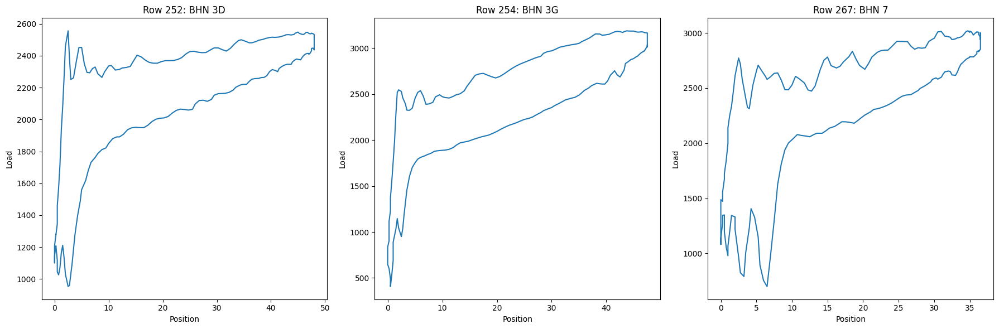

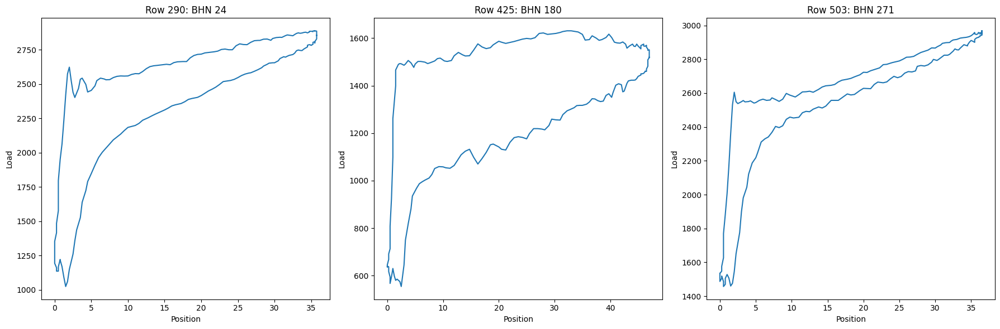

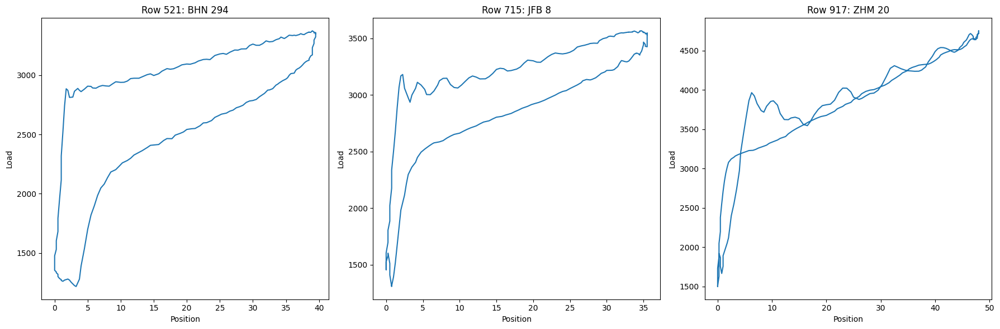

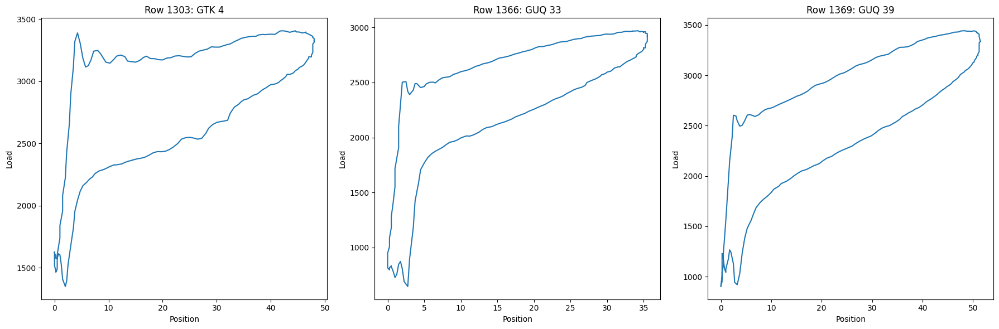

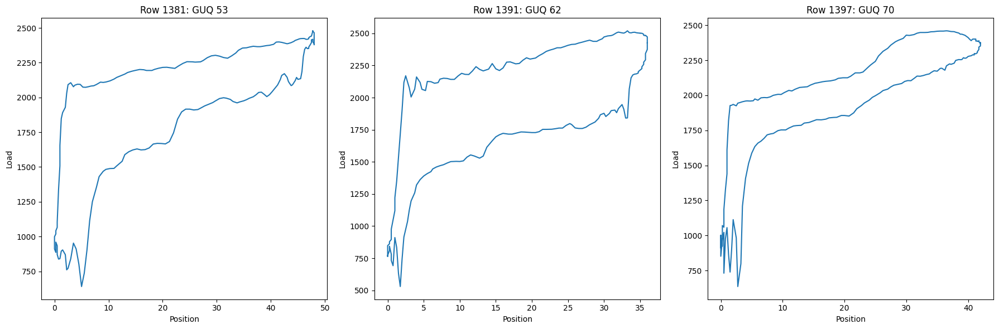

...

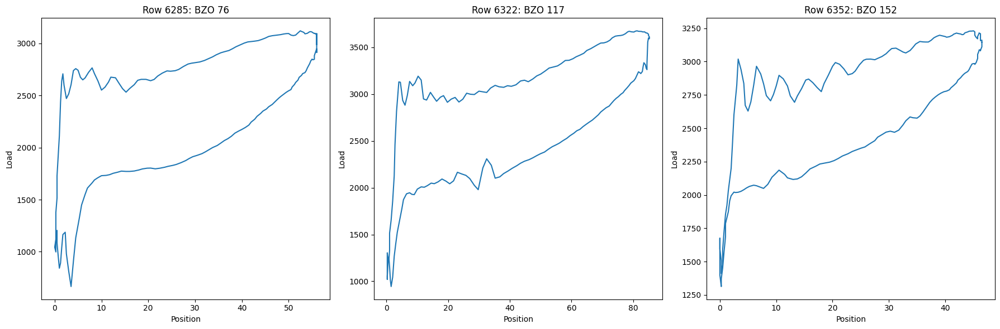

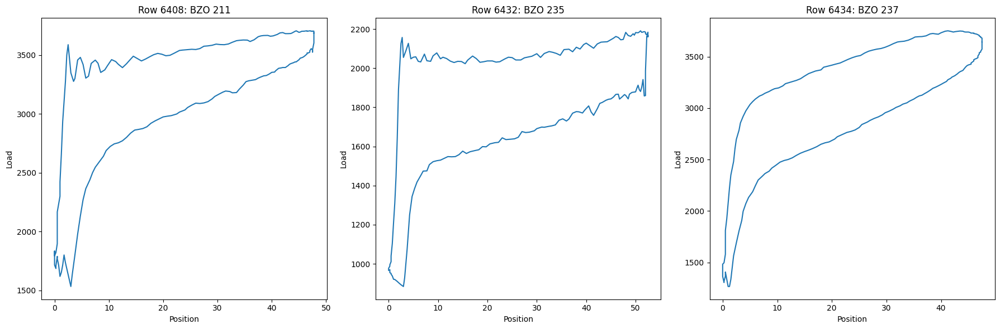

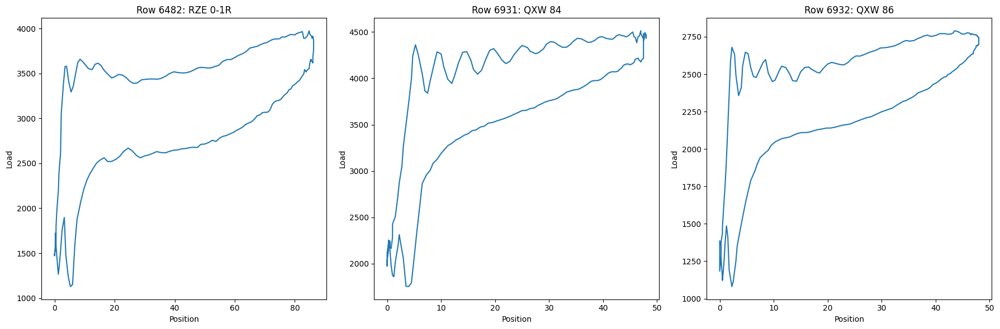

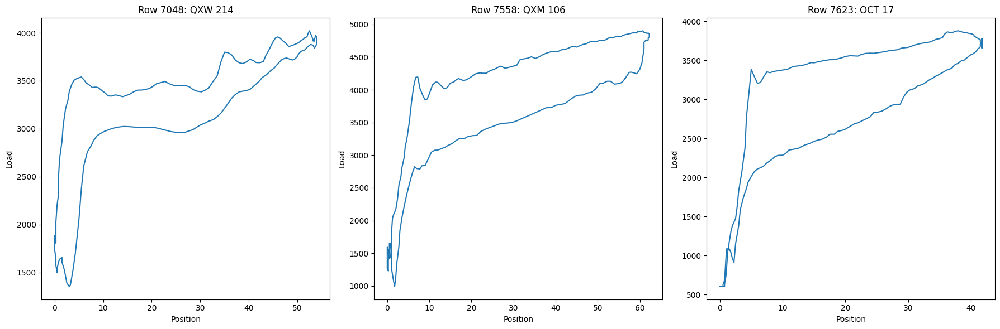

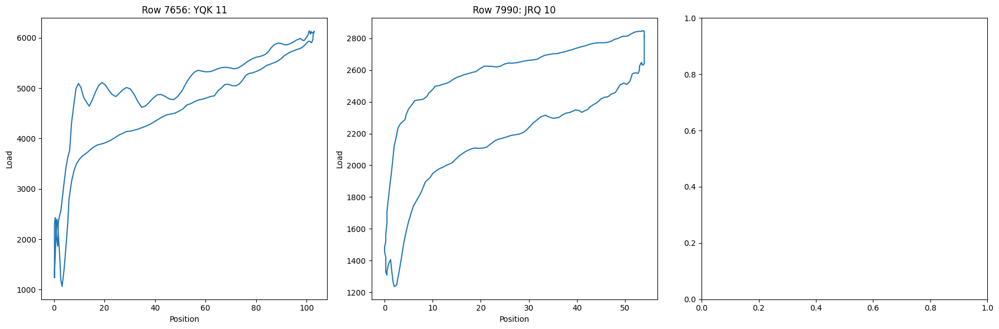

Number of cards in Cluster 53: 6


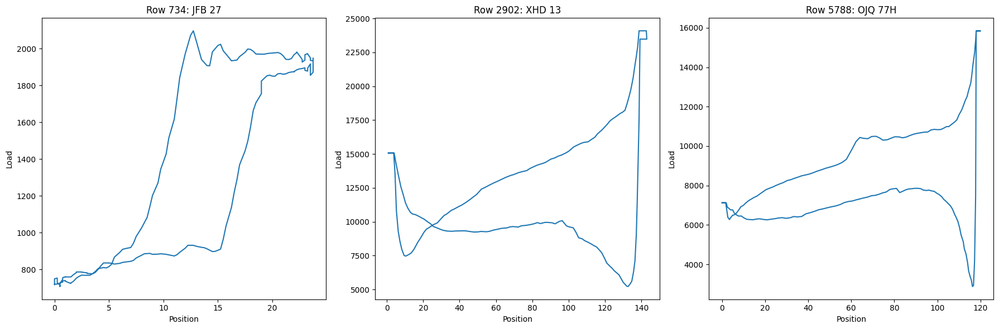

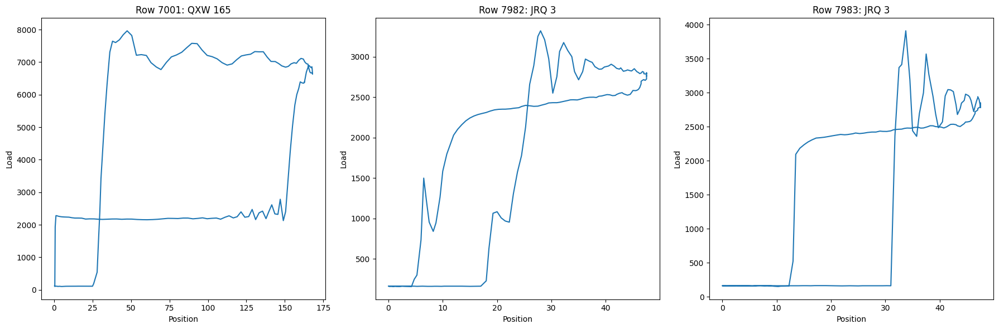

In [13]:
# Set the number of cards to plot in each row
cards_per_row = 3

# Iterate over the indices of the correlated clusters
for cluster_id in correlated_clusters:
    # Filter the original dataset based on the cluster labels of the correlated cluster
    correlated_cards_data = d200_cleaned_position_load[clusters == cluster_id]

    # Extract the number of correlated cards
    num_correlated_cards = correlated_cards_data.shape[0]

    # Print the count of correlated cards
    print(f"Number of cards in Cluster {cluster_id+1}: {num_correlated_cards}")

    # Calculate the number of rows required for plotting
    num_rows = (num_correlated_cards + cards_per_row - 1) // cards_per_row

    # Iterate over the correlated cards data and plot position vs load profiles for each card
    for i, (index, row) in enumerate(correlated_cards_data.iterrows()):
        # Create a new figure and axis for each new row
        if i % cards_per_row == 0:
            fig, axs = plt.subplots(1, cards_per_row, figsize=(18, 6))
            plt.subplots_adjust(wspace=0.3)  # Adjust space between subplots

        # Calculate the column index for subplot
        col_index = i % cards_per_row

        # Plot position vs load profile
        axs[col_index].plot(row[position_columns], row[load_columns])
        axs[col_index].set_title(f"Row {index}: {row['WellName']}")  # Set title with row number and card name
        axs[col_index].set_xlabel('Position')
        axs[col_index].set_ylabel('Load')

        # If it's the last subplot in the row or the last card, show the plot
        if (i % cards_per_row == cards_per_row - 1) or (i == num_correlated_cards - 1):
            plt.tight_layout()
            plt.show()